In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

Below code to display full output in jupyter notebook

In [ ]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

#Exploratory Data Analysis

In [ ]:
df.info()

In [ ]:
df.shape,df.dtypes
# The dataset has 10 variables and 245661 data entries

In [ ]:
df.head(), df.tail()

In [ ]:
df.columns

Removing first column as it got generated during sampling

In [ ]:
dfnew = df.drop('Unnamed: 0', axis = 1)

In [ ]:
dfnew.shape,dfnew.dtypes,dfnew.head()

In [ ]:
dfnew.describe()

In [ ]:
dfnew.skew()

Checking missing values

In [ ]:
import missingno as ms
ms.bar(dfnew)

No missing values in the dataset. Checking the descriptive statistics of numerical variable and distribution of categorical variable

In [ ]:
dfnew['Sales'].describe(),dfnew['Customers'].describe()

In [ ]:
px.box(dfnew,y='Sales')

In [ ]:
px.box(dfnew,y='Customers')

In [ ]:
px.box(dfnew,y='Sales',x='Promo')

In [ ]:
px.box(dfnew,y='Sales',x='DayOfWeek', hover_data=['Store'])

In [ ]:
dfnew['Open'].value_counts(),dfnew['Promo'].value_counts(),dfnew['StateHoliday'].value_counts(),dfnew['SchoolHoliday'].value_counts()

(1    203621
 0     42040
 Name: Open, dtype: int64, 0    152641
 1     93020
 Name: Promo, dtype: int64, 0    238004
 a      5003
 b      1652
 c      1002
 Name: StateHoliday, dtype: int64, 0    203549
 1     42112
 Name: SchoolHoliday, dtype: int64)

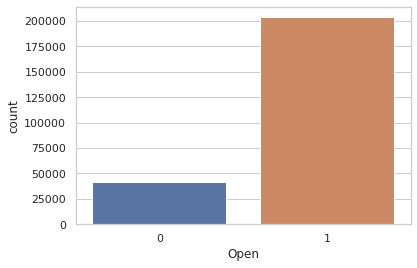

In [ ]:
sns.countplot(data = dfnew, x = 'Open')

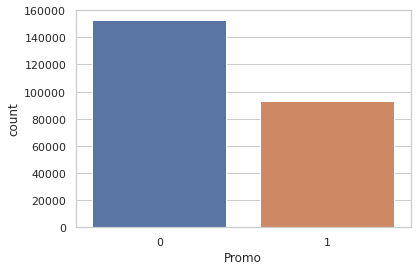

In [ ]:
sns.countplot(data = dfnew, x = 'Promo')

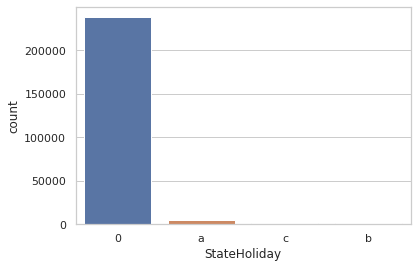

In [ ]:
sns.countplot(data = dfnew, x = 'StateHoliday')

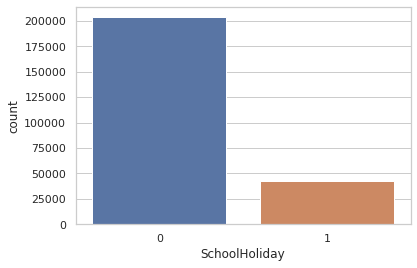

In [ ]:
sns.countplot(data = dfnew, x = 'SchoolHoliday')

In [ ]:
px.histogram(dfnew, x = 'Sales')

In [ ]:
px.histogram(dfnew, x = 'Customers')

In [ ]:
px.histogram(dfnew, x = 'Promo')

In [ ]:
dfnew['Date'].max(), dfnew['Date'].min()

('2015-06-30', '2013-01-01')

Sales data is from Jan 2013 to June 2015

Analyze the top 20 

In [ ]:
top20 =dfnew.nlargest(20,'Sales')

In [ ]:
top20

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
60458,262,5,2015-04-03,38722,5132,1,1,b,0
53045,262,5,2015-05-01,38484,5458,1,1,a,0
58965,262,4,2015-05-14,38367,5192,1,0,a,1
175574,817,1,2013-12-16,38025,4381,1,1,0,0
197431,262,7,2013-12-22,37376,4916,1,0,0,0
49935,262,7,2014-12-21,37122,4962,1,0,0,0
122354,262,5,2013-03-29,36227,5069,1,1,b,0
31142,1114,1,2013-12-23,35697,4911,1,0,0,1
98489,251,1,2013-12-23,35350,4635,1,0,0,1
244983,57,2,2014-06-17,34692,1930,1,1,0,0


In [ ]:
top20['Store'].value_counts()

262     10
817      3
126      1
348      1
251      1
1114     1
57       1
842      1
586      1
Name: Store, dtype: int64

Analyze the data for Store 262 only. 

In [ ]:
df262 = dfnew.loc[dfnew['Store']==262]

In [ ]:
df262.shape

(235, 9)

Grouping Data to get average day wise sale

In [ ]:
dfgroup1 = df262.groupby('DayOfWeek', as_index=False).agg({"Sales": "mean"})

In [ ]:
dfgroup1.head()

,DayOfWeek,Sales
0,1,20227.677419
1,2,18379.312500
2,3,18342.942857
3,4,20185.685714
4,5,22592.714286


In [ ]:
px.bar(dfgroup1, y ='Sales', x = 'DayOfWeek')

7th day has the maximum average sale. 

Now lets analyze the store with minimum sales

In [ ]:
bottom20 =dfnew.nsmallest(20,'Sales')

In [ ]:
bottom20

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
2,950,5,2015-05-01,0,0,0,1,a,0
3,701,7,2013-10-13,0,0,0,0,0,0
4,881,4,2013-12-26,0,0,0,0,c,1
39,624,7,2014-10-19,0,0,0,0,0,0
40,1061,7,2013-03-24,0,0,0,0,0,0
44,637,3,2014-01-01,0,0,0,0,a,1
51,631,7,2015-02-01,0,0,0,0,0,0
54,408,7,2015-05-03,0,0,0,0,0,0
56,882,7,2014-03-02,0,0,0,0,0,0
59,580,5,2014-04-18,0,0,0,1,b,1


Stores with zero sales, will not add any value to the analysis Find non zero sales data

First sort values in ascending order

In [ ]:
  dfsort = dfnew.sort_values(by=['Sales'],ascending = True)

In [ ]:
dfsort.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
122830,936,7,2014-02-23,0,0,0,0,0,0
29073,533,7,2015-03-01,0,0,0,0,0,0
154117,10,7,2013-01-06,0,0,0,0,0,0
154113,125,7,2014-06-22,0,0,0,0,0,0
154111,914,4,2013-05-09,0,0,0,0,a,0


Below code will find the non zero value. 

In [ ]:
dfnonzero = dfsort.loc[dfsort['Sales'].ne(0).idxmax():]

In [ ]:
bottom20actual = dfnonzero.nsmallest(20, 'Sales')

In [ ]:
bottom20actual['Store'].value_counts()

198    12
543     1
969     1
310     1
607     1
209     1
681     1
786     1
867     1
Name: Store, dtype: int64

198 Store has the minimum sale, Lets analyze 198 store

In [ ]:
df198 = dfnew.loc[dfnew['Store']==198]
dfgroup2 = df198.groupby('DayOfWeek', as_index=False).agg({"Sales": "mean"})

In [ ]:
df198['Sales'].head(), df198['Sales'].tail()

(130     1544
 224        0
 444     5726
 501     1100
 4262     761
 Name: Sales, dtype: int64, 238046    3216
 239877    3128
 240242     917
 241995    2481
 242476    2042
 Name: Sales, dtype: int64)

In [ ]:
df198.shape

(212, 9)

Grouping Data to get average day wise sale

In [ ]:
dfgroup2 = df198.groupby('DayOfWeek', as_index=False).agg({"Sales": "mean"})

In [ ]:
dfgroup2

,DayOfWeek,Sales
0,1,3647.250000
1,2,3847.227273
2,3,2657.611111
3,4,2655.083333
4,5,2961.500000
5,6,899.387097
6,7,0.000000


In [ ]:
px.bar(dfgroup2, y ='Sales', x = 'DayOfWeek')

Store with maximum sales is 262 and store with minimum sale is 198. Lets go in more depth for individual store

In [ ]:
df262['Sales'].describe(), df198['Sales'].describe()

(count      235.000000
 mean     20631.246809
 std       4861.562154
 min      14503.000000
 25%      17457.500000
 50%      19051.000000
 75%      21708.000000
 max      38722.000000
 Name: Sales, dtype: float64, count     212.000000
 mean     2209.009434
 std      1716.907409
 min         0.000000
 25%       757.500000
 50%      2052.500000
 75%      3400.000000
 max      7745.000000
 Name: Sales, dtype: float64)

Lets analyze the customers

In [ ]:
dfgroupwithcustomer = df262.groupby('DayOfWeek', as_index=False).agg({"Sales": "mean", "Customers":"max"})

In [ ]:
dfgroupwithcustomer

,DayOfWeek,Sales,Customers
0,1,20227.677419,4102
1,2,18379.312500,3719
2,3,18342.942857,3423
3,4,20185.685714,5192
4,5,22592.714286,5458
5,6,17393.277778,3878
6,7,27991.677419,5145


In [ ]:
dfgroup1withcustomer = df198.groupby('DayOfWeek', as_index=False).agg({"Sales": "mean", "Customers":"max"})

In [ ]:
dfgroup1withcustomer

,DayOfWeek,Sales,Customers
0,1,3647.250000,628
1,2,3847.227273,665
2,3,2657.611111,469
3,4,2655.083333,609
4,5,2961.500000,477
5,6,899.387097,373
6,7,0.000000,0


Let's visualize the correlation between Sales and Customers

In [ ]:
fig=px.scatter_matrix(dfnew, dimensions=['Sales','Customers'])
fig.show()

In [ ]:
fig=px.scatter_matrix(df262, dimensions=['Sales','Customers'])
fig.show()

In [ ]:
fig=px.scatter_matrix(df198, dimensions=['Sales','Customers'])
fig.show()

In [ ]:
px.bar(df262,x='DayOfWeek', y= 'Sales', color='Promo')

In [ ]:
px.bar(df198,x='DayOfWeek', y= 'Sales', color='Promo')

Promos are in Weekdays and are more in store with the least sales

In [ ]:
px.bar(df262,x='DayOfWeek', y= 'Sales', color='StateHoliday')

In [ ]:
px.bar(df262,x='DayOfWeek', y= 'Sales', color='SchoolHoliday')

In [ ]:
px.bar(df198,x='DayOfWeek', y= 'Sales', color='StateHoliday')

In [ ]:
px.bar(df198,x='DayOfWeek', y= 'Sales', color='SchoolHoliday')

In [ ]:
import seaborn as sns
sns.set_theme(style="whitegrid")
sns.barplot(x='Promo', y='Sales', data=dfnew).set(title='Promo vs.Sales')
#sns.barplot(x='Promo', y='Customers', data=dfnew)
#Sales higher when promo is applied

In [ ]:
#Day of week
sns.set_theme(style="whitegrid")
sns.barplot(x='DayOfWeek', y='Sales', data=df, order=[1,2,3,4,5,6,7]).set(title='Day of week vs.Sales')

Finding Correlation Matrix Heatmap using Correlation Plot

In [ ]:
corr = dfnew.corr()
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_title('Correlation Matrix Heatmap')
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

# Data Preparation 

Importing libraries

In [ ]:
import math
from sklearn import preprocessing
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA



Performing feature engineering by creating three new columns to the dataset called as day, month and year using the feature 'Date'.

In [ ]:
#dfnew['day']=pd.to_datetime(dfnew['Date'], format='%Y-%m-%d').dt.day
#dfnew['month']=pd.to_datetime(dfnew['Date'], format='%Y-%m-%d').dt.month
#dfnew['year']=pd.to_datetime(dfnew['Date'], format='%Y-%m-%d').dt.year

Dropping feature 'Date' from fitting linear regression model

In [ ]:
#Look into drop moth day and year from the model and see how it improves accuracy.
dfnew.drop('Date', axis=1, inplace=True)
dfnew.drop('DayOfWeek', axis=1, inplace=True)

'StateHoliday' is a categorical variable. Converting the feature into a numerical variable.

In [ ]:
newsh={'0':0, 'a':1, 'b':2, 'c':3,0:0}

In [ ]:
dfnew['StateHoliday']=dfnew['StateHoliday'].map(newsh)

In [ ]:
dfnew['StateHoliday'].unique()

In [ ]:
#Preparing X
X = np.array(dfnew.drop(['Sales'], 1)) 

#Scaling X to speed up processing
X = preprocessing.scale(X)

#Preparing y
y = np.array(dfnew['Sales'])


Saving 1% of dataset for validation

In [ ]:
validation = int(math.ceil(0.01 * len(dfnew)))
validation
X = X[:-validation]
y = y[:-validation]

Saving data for validation

Splitting the data into train and test dataset using 80/20 ratio

In [ ]:
X_train,X_test,y_train,y_test= train_test_split(X,y,test_size=0.2, random_state=100)

In [ ]:
len(X_train)

In [ ]:
len(X_test)

In [ ]:
len(y_test)

**Multiple Linear Regression**

In [ ]:
#Print the coefficients and write down the equation for presentation
model=LinearRegression()
model.fit(X_train,y_train)
pred_model=model.predict(X_test)

score_model=cross_val_score(model,X,y,cv=5)
print(score_model)

In [ ]:
pred_lr=pd.DataFrame({'Predictions':pred_model,'Actual':y_test})
pred_lr=pred_lr.reset_index(drop=True)
pred_lr.head()

In [ ]:
plt.figure(figsize=(10,10))
pred_lr["Actual"][:25,].plot.line()
pred_lr["Predictions"][:25,].plot.line()
plt.legend()
plt.show()

In [ ]:
score_model.mean()

In [ ]:
score_model.std()

In [ ]:
mean_absolute_error(y_test,pred_model)

In [ ]:
mean_squared_error(y_test,pred_model)

**Other Regression Techniques**

**Random Forest Model**

In [ ]:
model_rf=RandomForestRegressor()
model_rf.fit(X_train,y_train)
pred_rf=model_rf.predict(X_test)

score_model_rf=cross_val_score(model_rf,X,y,cv=5)
print(score_model_rf)

Predicting Sales using Randomforest Model

In [ ]:
tmprf=pd.DataFrame({'Predictions':pred_rf,'Actual':y_test})
tmprf=tmprf.reset_index(drop=True)
tmprf.head()

Plot of Predicted vs actual for Randomforest model

In [ ]:
plt.figure(figsize=(10,10))
tmprf["Actual"][:25,].plot.line()
tmprf["Predictions"][:25,].plot.line()
plt.legend()
plt.show()

Accuracy of Random Forest model

In [ ]:
score_model_rf.mean()

MAE of Randomforest model




In [ ]:
mean_absolute_error(y_test,pred_rf)

MSE of Randomforest model

In [ ]:
mean_squared_error(y_test,pred_rf)

RMSE of Randomforest model

In [ ]:
np.sqrt(mean_squared_error(y_test,pred_rf))

Validation for Random Forest Model

In [ ]:
df.shape
X = np.array(dfnew.drop(['Sales'], 1))
X = preprocessing.scale(X)
X_validation = X[-validation:]
X_validation.shape 
forecast_set = model_rf.predict(X_validation)
forecast_set

**Decision Tree Regressor**

In [ ]:
model_dt=DecisionTreeRegressor()
model_dt.fit(X_train,y_train)
pred_dt=model_dt.predict(X_test)

score_model_dt=cross_val_score(model_dt,X,y,cv=5)
print(score_model_dt)

Predicting Sales using Decision Tree Regressor

In [ ]:
tmpdt=pd.DataFrame({'Predictions':pred_dt,'Actual':y_test})
tmpdt=tmpdt.reset_index(drop=True)
tmpdt.head()

In [ ]:
plt.figure(figsize=(10,10))
tmpdt["Actual"][:25,].plot.line()
tmpdt["Predictions"][:25,].plot.line()
plt.legend()
plt.show()

In [ ]:
score_model_dt.mean()

In [ ]:
mean_absolute_error(y_test,pred_dt)

In [ ]:
mean_squared_error(y_test,pred_dt)

In [ ]:
np.sqrt(mean_squared_error(y_test,pred_dt))

Validation of random forest

**K Neighbors Classifier**

In [ ]:
model_kn=KNeighborsClassifier()
model_kn.fit(X_train,y_train)
pred_kn=model_kn.predict(X_test)
score_model_kn=cross_val_score(model_kn,X,y,cv=5)
print(score_model_kn)

In [ ]:
tmpkn=pd.DataFrame({'Predictions':pred_kn,'Actual':y_test})
tmpkn=tmpkn.reset_index(drop=True)
tmpkn.head()

In [ ]:
plt.figure(figsize=(10,10))
tmpkn["Actual"][:25,].plot.line()
tmpkn["Predictions"][:25,].plot.line()
plt.legend()
plt.show()

In [ ]:
score_model_kn.mean()

In [ ]:
mean_absolute_error(y_test,pred_kn)

In [ ]:
mean_squared_error(y_test,pred_kn)

In [ ]:
np.sqrt(mean_squared_error(y_test,pred_kn))